# How Route Choice can Impact Evacuation Times
[Link to turorial](https://www.jupedsim.org/stable/notebooks/routing.html#how-route-choice-can-impact-evacuation-times)

## Configuring the Room Layout

In [1]:
import pathlib

import jupedsim as jps
import matplotlib.pyplot as plt
import pedpy
import shapely
from matplotlib.patches import Circle
from shapely import Polygon
from jupedsim.internal.notebook_utils import animate, read_sqlite_file
%matplotlib inline
import plotly.graph_objects as go

In [2]:
complete_area = Polygon(
    [
        (0, 0),
        (0, 20),
        (20, 20),
        (20, 0),
    ]
)
obstacles = [
    Polygon(
        [
            (5, 0.0),
            (5, 16),
            (5.2, 16),
            (5.2, 0.0),
        ]
    ),
    Polygon([(15, 19), (15, 5), (7.2, 5), (7.2, 4.8), (15.2, 4.8), (15.2, 19)]),
]

exit_polygon = [(19, 19), (20, 19), (20, 20), (19, 20)]
waypoints = [([3, 19], 3), ([7, 19], 2), ([7, 2.5], 2), ([17.5, 2.5], 2)]
distribution_polygon = Polygon([[0, 0], [5, 0], [5, 10], [0, 10]])
obstacle = shapely.union_all(obstacles)  # combines obstacle polygons into only one polygon
walkable_area = pedpy.WalkableArea(shapely.difference(complete_area, obstacle)) # difference subtracts obstacle form complete_area

Text(2.5, 5.0, 'Start')

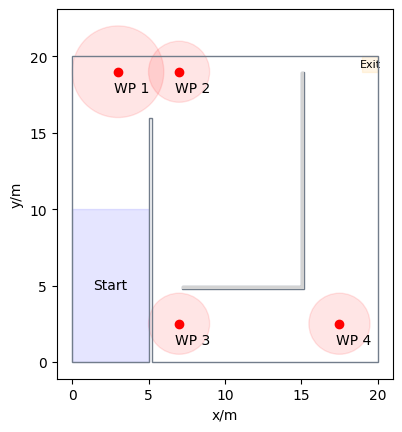

In [3]:
fig, ax = plt.subplots(nrows=1, ncols=1)
ax.set_aspect("equal")
pedpy.plot_walkable_area(walkable_area=walkable_area, axes=ax)

for idx, (waypoint, distance) in enumerate(waypoints):
    ax.plot(waypoint[0], waypoint[1], "ro")
    ax.annotate(
        f"WP {idx+1}",
        (waypoint[0], waypoint[1]),
        textcoords="offset points",
        xytext=(10, -15),
        ha="center",
    )
    circle = Circle(
        (waypoint[0], waypoint[1]), distance, fc="red", ec="red", alpha=0.1
    )
    ax.add_patch(circle)

x, y = Polygon(exit_polygon).exterior.xy
plt.fill(x, y, alpha=0.1, color="orange")
centroid = Polygon(exit_polygon).centroid
plt.text(centroid.x, centroid.y, "Exit", ha="center", va="center", fontsize=8)

x, y = distribution_polygon.exterior.xy
plt.fill(x, y, alpha=0.1, color="blue")
centroid = distribution_polygon.centroid
plt.text(centroid.x, centroid.y, "Start", ha="center", va="center", fontsize=10)

## Configuration of Simulation Scenarios

In [4]:
simulations = {}
percentages = [0, 20, 40, 50, 60, 70, 100]
total_agents = 100
for percentage in percentages:
    trajectory_file = f"../sqlite_data/trajectories_percentage_{percentage}.sqlite"
    simulation = jps.Simulation(
        dt=0.05,
        model=jps.CollisionFreeSpeedModel(
            strength_neighbor_repulsion=2.6,
            range_neighbor_repulsion=0.1,
            range_geometry_repulsion=0.05,
        ),
        geometry=walkable_area.polygon,
        trajectory_writer=jps.SqliteTrajectoryWriter(
            output_file=pathlib.Path(trajectory_file),
        ),
    )
    simulations[percentage] = simulation

## Outlining Agent Journeys

In [5]:
def set_journeys(simulation):
    exit_id = simulation.add_exit_stage(exit_polygon)
    waypoint_ids = []
    for waypoint, distance in waypoints:
        waypoint_ids.append(simulation.add_waypoint_stage(waypoint, distance))

    long_journey = jps.JourneyDescription([*waypoint_ids[:], exit_id])
    for idx, waypoint in enumerate(waypoint_ids):
        next_waypoint = (
            exit_id if idx == len(waypoint_ids) - 1 else waypoint_ids[idx + 1]
        )
        long_journey.set_transition_for_stage(
            waypoint, jps.Transition.create_fixed_transition(next_waypoint)
        )

    short_journey = jps.JourneyDescription([waypoint_ids[0], exit_id])
    short_journey.set_transition_for_stage(
        waypoint_ids[0], jps.Transition.create_fixed_transition(exit_id)
    )

    long_journey_id = simulation.add_journey(long_journey)
    short_journey_id = simulation.add_journey(short_journey)
    return short_journey_id, long_journey_id, waypoint_ids[0]

## Allocation and Configuration of Agents


In [6]:
positions = jps.distribute_by_number(
    polygon=distribution_polygon,
    number_of_agents=total_agents,
    distance_to_agents=0.4,
    distance_to_polygon=0.7,
    seed=45131502,
)

## Launching the Simulations

In [7]:
trajectory_files = {}
for percentage, simulation in simulations.items():
    short_journey_id, long_journey_id, first_waypoint_id = set_journeys(
        simulation
    )

    num_items = int(len(positions) * (percentage / 100.0))

    for position in positions[num_items:]: # second half of positions
        simulation.add_agent(
            jps.CollisionFreeSpeedModelAgentParameters(
                position=position,
                journey_id=short_journey_id,
                stage_id=first_waypoint_id,
            )
        )

    for position in positions[:num_items]: # first half of positions
        simulation.add_agent(
            jps.CollisionFreeSpeedModelAgentParameters(
                position=position,
                journey_id=long_journey_id,
                stage_id=first_waypoint_id,
            )
        )

    while simulation.agent_count() > 0 and simulation.iteration_count() < 3000:
        simulation.iterate()

    trajectory_file = f"../sqlite_data/trajectories_percentage_{percentage}.sqlite"
    trajectory_files[percentage] = trajectory_file

## Visualizing Agent Pathways

In [8]:
agent_trajectories = {}
for percentage in percentages:
    trajectory_file = trajectory_files[percentage]
    agent_trajectories[percentage], walkable_area = read_sqlite_file(
        trajectory_file
    )
    animate(
        agent_trajectories[percentage],
        walkable_area,
        title_note=f"Percentage: {percentage}%",
    ).show()

In [9]:
evac_times = []
for percentage, traj in agent_trajectories.items():
    t_evac = traj.data["frame"].max() / traj.frame_rate
    evac_times.append(t_evac)

In [10]:
fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=list(agent_trajectories.keys()),
        y=evac_times,
        marker=dict(size=10),
        mode="lines+markers",
        name="Evacuation Times",
    )
)

fig.update_layout(
    title="Evacuation Times vs. Percentages",
    xaxis_title="Percentage %",
    yaxis_title="Evacuation Time (s)",
)

fig.show()